# Extracting Pixel Values from Regional GOES-16 Data (NDVI)

source: https://geonetcast.wordpress.com/2022/07/07/extracting-pixel-values-from-regional-goes-16-data-ndvi/

In [2]:
# %load ../src/goes16_utils.py
# Training: Python and GOES-R Imagery: Script 8 - Functions for download data from AWS
#-----------------------------------------------------------------------------------------------------------
# Required modules
import os                                # Miscellaneous operating system interfaces
import numpy as np                       # Import the Numpy package
import colorsys                          # To make convertion of colormaps
import boto3                             # Amazon Web Services (AWS) SDK for Python
from botocore import UNSIGNED            # boto3 config
from botocore.config import Config       # boto3 config
import math                              # Mathematical functions
from datetime import datetime            # Basic Dates and time types
from osgeo import osr                    # Python bindings for GDAL
from osgeo import gdal                   # Python bindings for GDAL

#from netCDF4 import Dataset          # Read / Write NetCDF4 files
#import matplotlib.pyplot as plt      # Plotting library
#import cartopy, cartopy.crs as ccrs  # Plot maps
##import sys
#from datetime import timedelta, date, datetime   # Manipulate dates

#-----------------------------------------------------------------------------------------------------------
def loadCPT(path):

    try:
        f = open(path)
    except:
        print ("File ", path, "not found")
        return None

    lines = f.readlines()

    f.close()

    x = np.array([])
    r = np.array([])
    g = np.array([])
    b = np.array([])

    colorModel = 'RGB'

    for l in lines:
        ls = l.split()
        if l[0] == '#':
            if ls[-1] == 'HSV':
                colorModel = 'HSV'
                continue
            else:
                continue
        if ls[0] == 'B' or ls[0] == 'F' or ls[0] == 'N':
            pass
        else:
            x=np.append(x,float(ls[0]))
            r=np.append(r,float(ls[1]))
            g=np.append(g,float(ls[2]))
            b=np.append(b,float(ls[3]))
            xtemp = float(ls[4])
            rtemp = float(ls[5])
            gtemp = float(ls[6])
            btemp = float(ls[7])

        x=np.append(x,xtemp)
        r=np.append(r,rtemp)
        g=np.append(g,gtemp)
        b=np.append(b,btemp)

    if colorModel == 'HSV':
        for i in range(r.shape[0]):
            rr, gg, bb = colorsys.hsv_to_rgb(r[i]/360.,g[i],b[i])
        r[i] = rr ; g[i] = gg ; b[i] = bb

    if colorModel == 'RGB':
        r = r/255.0
        g = g/255.0
        b = b/255.0

    xNorm = (x - x[0])/(x[-1] - x[0])

    red   = []
    blue  = []
    green = []

    for i in range(len(x)):
        red.append([xNorm[i],r[i],r[i]])
        green.append([xNorm[i],g[i],g[i]])
        blue.append([xNorm[i],b[i],b[i]])

    colorDict = {'red': red, 'green': green, 'blue': blue}

    return colorDict
#-----------------------------------------------------------------------------------------------------------
def download_CMI(yyyymmddhhmn, band, path_dest):

  os.makedirs(path_dest, exist_ok=True)

  year = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%Y')
  day_of_year = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%j')
  hour = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%H')
  min = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%M')

  # AMAZON repository information
  # https://noaa-goes16.s3.amazonaws.com/index.html
  bucket_name = 'noaa-goes16'
  product_name = 'ABI-L2-CMIPF'

  # Initializes the S3 client
  s3_client = boto3.client('s3', config=Config(signature_version=UNSIGNED))
  #-----------------------------------------------------------------------------------------------------------
  # File structure
  prefix = f'{product_name}/{year}/{day_of_year}/{hour}/OR_{product_name}-M6C{int(band):02.0f}_G16_s{year}{day_of_year}{hour}{min}'

  # Seach for the file on the server
  s3_result = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=prefix, Delimiter = "/")

  #-----------------------------------------------------------------------------------------------------------
  # Check if there are files available
  if 'Contents' not in s3_result:
    # There are no files
    print(f'No files found for the date: {yyyymmddhhmn}, Band-{band}')
    return -1
  else:
    # There are files
    for obj in s3_result['Contents']:
      key = obj['Key']
      # Print the file name
      file_name = key.split('/')[-1].split('.')[0]

      # Download the file
      if os.path.exists(f'{path_dest}/{file_name}.nc'):
        print(f'File {path_dest}/{file_name}.nc exists')
      else:
        print(f'Downloading file {path_dest}/{file_name}.nc')
        s3_client.download_file(bucket_name, key, f'{path_dest}/{file_name}.nc')
  return f'{file_name}'

s3_client = boto3.client('s3', config=Config(signature_version=UNSIGNED))

#-----------------------------------------------------------------------------------------------------------
def download_PROD(yyyymmddhhmn, product_name, path_dest):

  os.makedirs(path_dest, exist_ok=True)

  year = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%Y')
  day_of_year = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%j')
  hour = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%H')
  min = datetime.strptime(yyyymmddhhmn, '%Y%m%d%H%M').strftime('%M')

  # AMAZON repository information
  # https://noaa-goes16.s3.amazonaws.com/index.html
  bucket_name = 'noaa-goes16'

  # Initializes the S3 client
  # s3_client = boto3.client('s3', config=Config(signature_version=UNSIGNED))

  #-----------------------------------------------------------------------------------------------------------
  # File structure
  prefix = f'{product_name}/{year}/{day_of_year}/{hour}/OR_{product_name}-M6_G16_s{year}{day_of_year}{hour}{min}'

  # Seach for the file on the server
  s3_result = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=prefix, Delimiter = "/")

  #-----------------------------------------------------------------------------------------------------------
  # Check if there are files available
  if 'Contents' not in s3_result:
    # There are no files
    print(f'No files found for the date: {yyyymmddhhmn}, Product: {product_name}')
    return -1
  else:
    # There are files
    for obj in s3_result['Contents']:
      key = obj['Key']
      # Print the file name
      file_name = key.split('/')[-1].split('.')[0]

      # print(f'File name: {file_name}')

      # Download the file
      if os.path.exists(f'{path_dest}/{file_name}.nc'):
        print(f'File {path_dest}/{file_name}.nc exists')
      else:
        # print(f'Downloading file {path_dest}/{file_name}.nc')
        s3_client.download_file(bucket_name, key, f'{path_dest}/{file_name}.nc')
  return f'{file_name}'

#-----------------------------------------------------------------------------------------------------------
def download_GLM(yyyymmddhhmnss, path_dest):

  os.makedirs(path_dest, exist_ok=True)

  year = datetime.strptime(yyyymmddhhmnss, '%Y%m%d%H%M%S').strftime('%Y')
  day_of_year = datetime.strptime(yyyymmddhhmnss, '%Y%m%d%H%M%S').strftime('%j')
  hour = datetime.strptime(yyyymmddhhmnss, '%Y%m%d%H%M%S').strftime('%H')
  min = datetime.strptime(yyyymmddhhmnss, '%Y%m%d%H%M%S').strftime('%M')
  seg = datetime.strptime(yyyymmddhhmnss, '%Y%m%d%H%M%S').strftime('%S')

  # AMAZON repository information
  # https://noaa-goes16.s3.amazonaws.com/index.html
  bucket_name = 'noaa-goes16'

  # Initializes the S3 client
  s3_client = boto3.client('s3', config=Config(signature_version=UNSIGNED))
  #-----------------------------------------------------------------------------------------------------------
  # File structure
  product_name = "GLM-L2-LCFA"
  prefix = f'{product_name}/{year}/{day_of_year}/{hour}/OR_{product_name}_G16_s{year}{day_of_year}{hour}{min}{seg}'

  # Seach for the file on the server
  s3_result = s3_client.list_objects_v2(Bucket=bucket_name, Prefix=prefix, Delimiter = "/")

  #-----------------------------------------------------------------------------------------------------------
  # Check if there are files available
  if 'Contents' not in s3_result:
    # There are no files
    print(f'No files found for the date: {yyyymmddhhmnss}, Product-{product_name}')
    return -1
  else:
    # There are files
    for obj in s3_result['Contents']:
      key = obj['Key']
      # Print the file name
      file_name = key.split('/')[-1].split('.')[0]

      # Download the file
      if os.path.exists(f'{path_dest}/{file_name}.nc'):
        print(f'File {path_dest}/{file_name}.nc exists')
      else:
        print(f'Downloading file {path_dest}/{file_name}.nc')
        s3_client.download_file(bucket_name, key, f'{path_dest}/{file_name}.nc')
  return f'{file_name}'

#-----------------------------------------------------------------------------------------------------------
# Functions to convert lat / lon extent to array indices
def geo2grid(lat, lon, nc):

    # Apply scale and offset
    xscale, xoffset = nc.variables['x'].scale_factor, nc.variables['x'].add_offset
    yscale, yoffset = nc.variables['y'].scale_factor, nc.variables['y'].add_offset

    x, y = latlon2xy(lat, lon)
    col = (x - xoffset)/xscale
    lin = (y - yoffset)/yscale
    return int(lin), int(col)

def latlon2xy(lat, lon):
    # goes_imagery_projection:semi_major_axis
    req = 6378137 # meters
    #  goes_imagery_projection:inverse_flattening
    invf = 298.257222096
    # goes_imagery_projection:semi_minor_axis
    rpol = 6356752.31414 # meters
    e = 0.0818191910435
    # goes_imagery_projection:perspective_point_height + goes_imagery_projection:semi_major_axis
    H = 42164160 # meters
    # goes_imagery_projection: longitude_of_projection_origin
    lambda0 = -1.308996939

    # Convert to radians
    latRad = lat * (math.pi/180)
    lonRad = lon * (math.pi/180)

    # (1) geocentric latitude
    Phi_c = math.atan(((rpol * rpol)/(req * req)) * math.tan(latRad))
    # (2) geocentric distance to the point on the ellipsoid
    rc = rpol/(math.sqrt(1 - ((e * e) * (math.cos(Phi_c) * math.cos(Phi_c)))))
    # (3) sx
    sx = H - (rc * math.cos(Phi_c) * math.cos(lonRad - lambda0))
    # (4) sy
    sy = -rc * math.cos(Phi_c) * math.sin(lonRad - lambda0)
    # (5)
    sz = rc * math.sin(Phi_c)

    # x,y
    x = math.asin((-sy)/math.sqrt((sx*sx) + (sy*sy) + (sz*sz)))
    y = math.atan(sz/sx)

    return x, y

# Function to convert lat / lon extent to GOES-16 extents
def convertExtent2GOESProjection(extent):
    # GOES-16 viewing point (satellite position) height above the earth
    GOES16_HEIGHT = 35786023.0
    # GOES-16 longitude position
    GOES16_LONGITUDE = -75.0

    a, b = latlon2xy(extent[1], extent[0])
    c, d = latlon2xy(extent[3], extent[2])
    return (a * GOES16_HEIGHT, c * GOES16_HEIGHT, b * GOES16_HEIGHT, d * GOES16_HEIGHT)

#-----------------------------------------------------------------------------------------------------------
# Function to reproject the data
def reproject(file_name, ncfile, array, extent, undef):

    # Read the original file projection and configure the output projection
    source_prj = osr.SpatialReference()
    source_prj.ImportFromProj4(ncfile.GetProjectionRef())

    target_prj = osr.SpatialReference()
    target_prj.ImportFromProj4("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

    # Reproject the data
    GeoT = ncfile.GetGeoTransform()
    driver = gdal.GetDriverByName('MEM')
    raw = driver.Create('raw', array.shape[0], array.shape[1], 1, gdal.GDT_Float32)
    raw.SetGeoTransform(GeoT)
    raw.GetRasterBand(1).WriteArray(array)

    # Define the parameters of the output file
    kwargs = {'format': 'netCDF', \
            'srcSRS': source_prj, \
            'dstSRS': target_prj, \
            'outputBounds': (extent[0], extent[3], extent[2], extent[1]), \
            'outputBoundsSRS': target_prj, \
            'outputType': gdal.GDT_Float32, \
            'srcNodata': undef, \
            'dstNodata': 'nan', \
            'resampleAlg': gdal.GRA_NearestNeighbour}

    # Write the reprojected file on disk
    gdal.Warp(file_name, raw, **kwargs)

202201011800
File ../data/goes16/Samples/OR_ABI-L2-CMIPF-M6C02_G16_s20220011800205_e20220011809513_c20220011809585.nc exists
File ../data/goes16/Samples/OR_ABI-L2-CMIPF-M6C03_G16_s20220011800205_e20220011809513_c20220011809586.nc exists


/home/ebezerra/anaconda3/envs/atmoseer/lib/python3.10/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


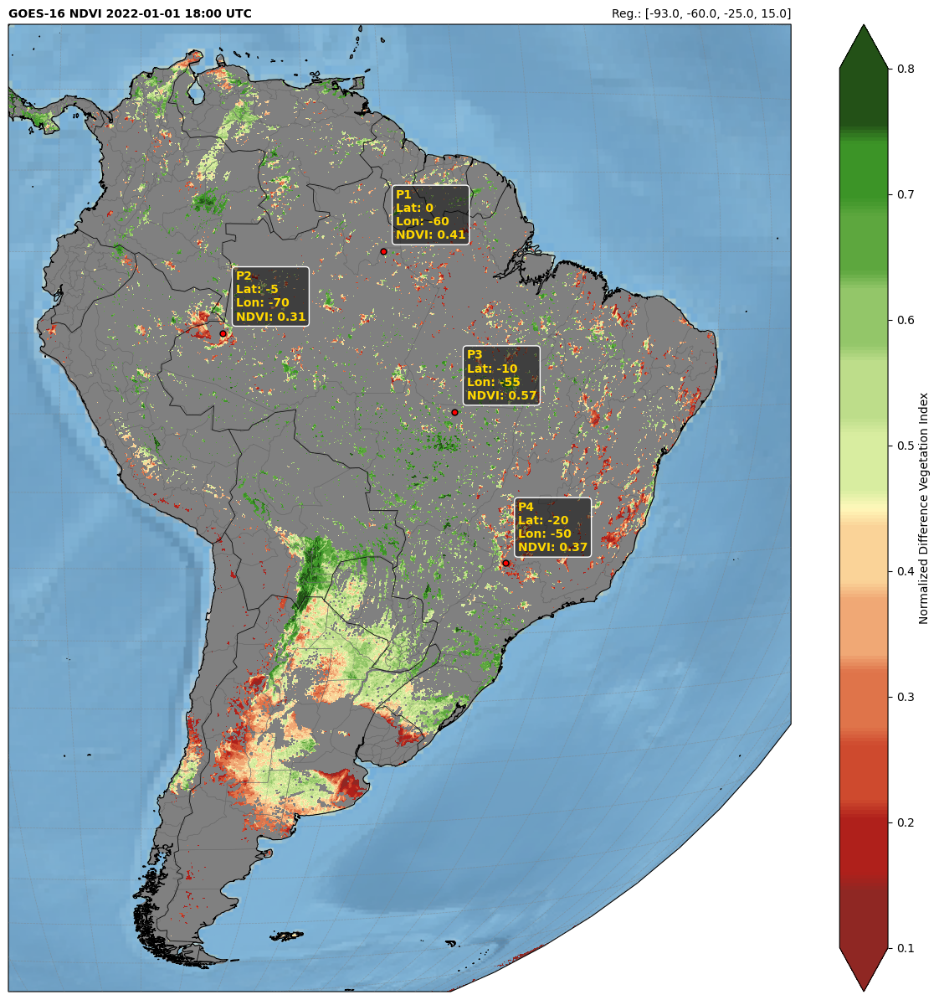

202201021800


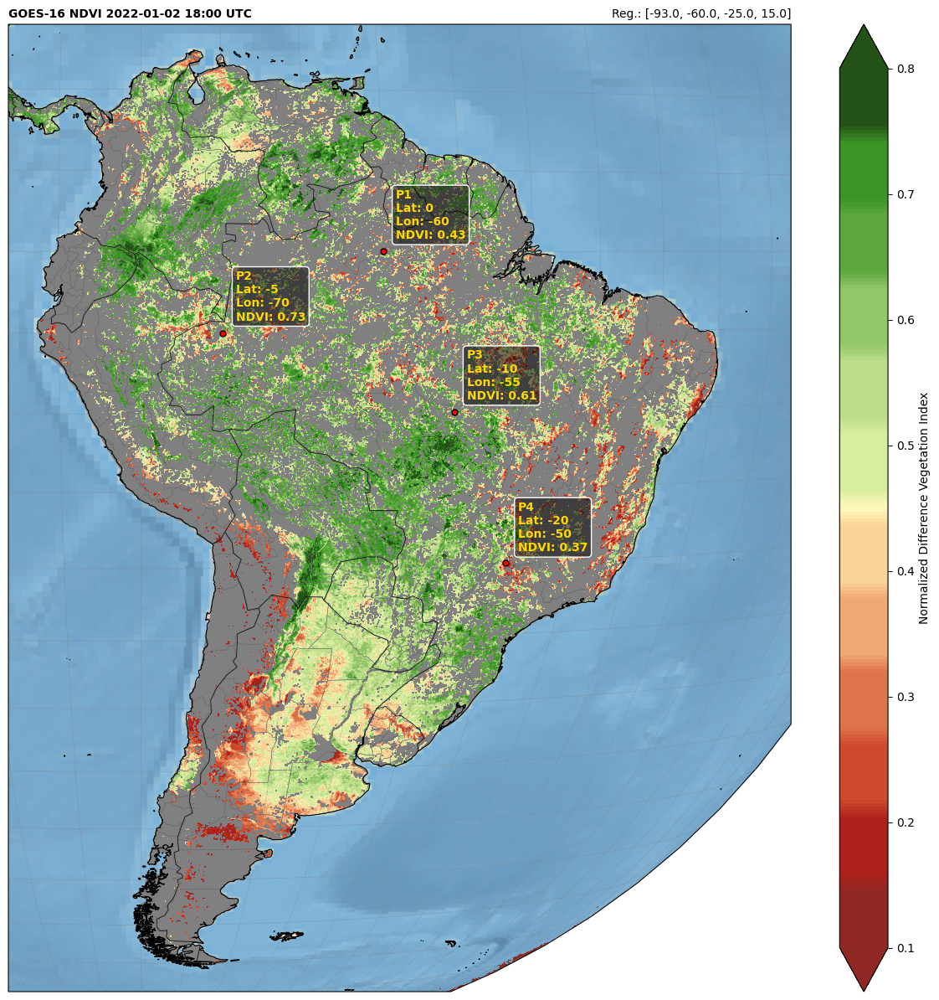

202201031800


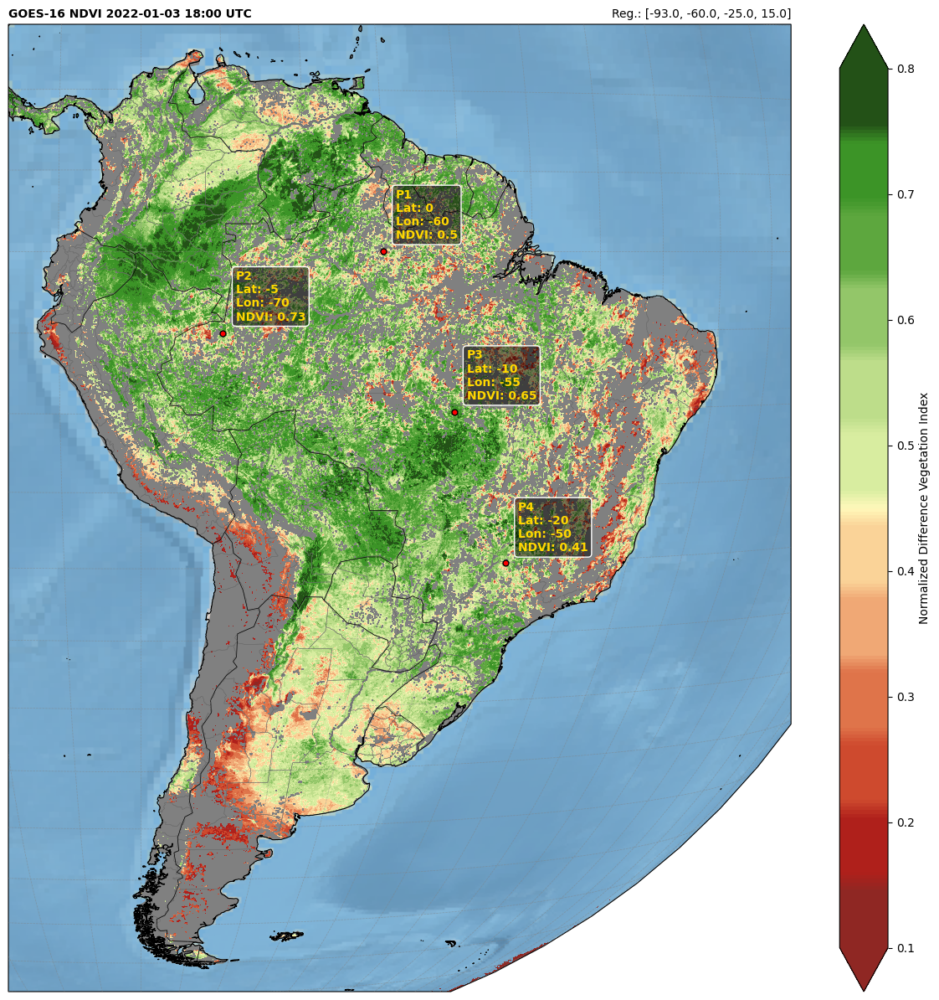

202201041800
No files found for the date: 202201041800, Band-2
No files found for the date: 202201041800, Band-3
The file is not available, skipping this iteration.
202201051800


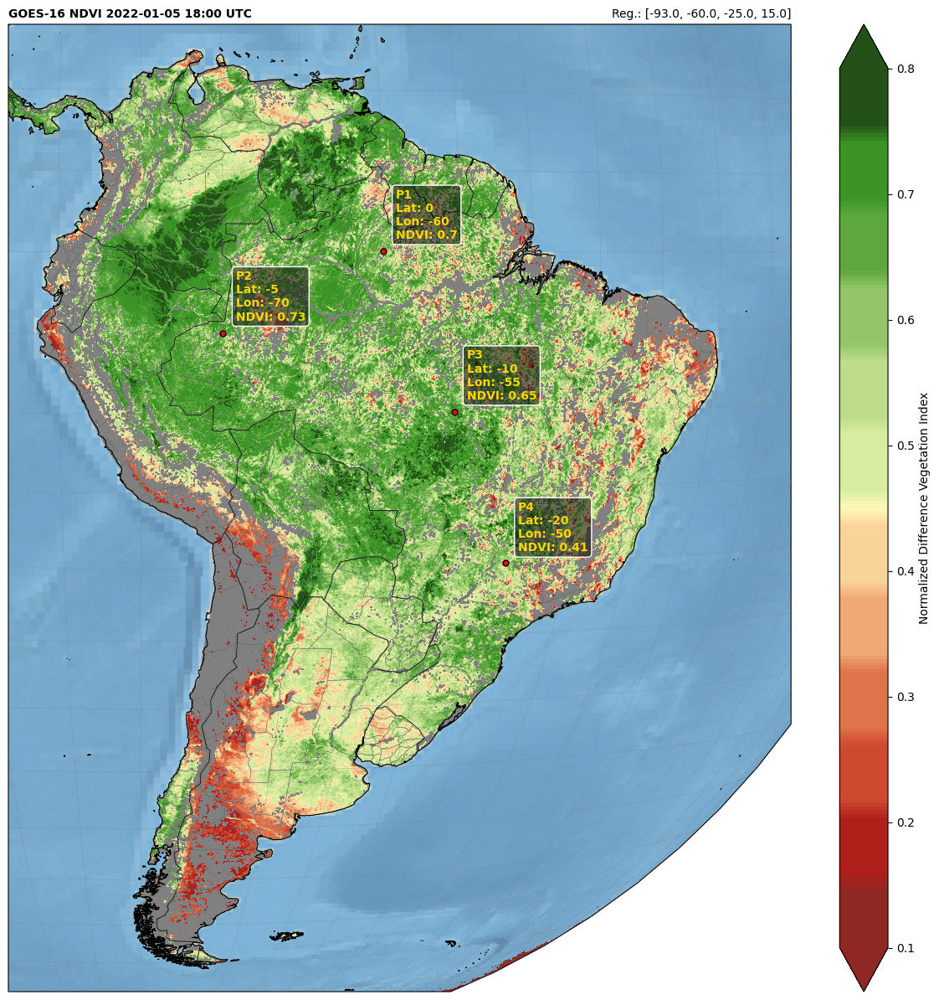

202201061800


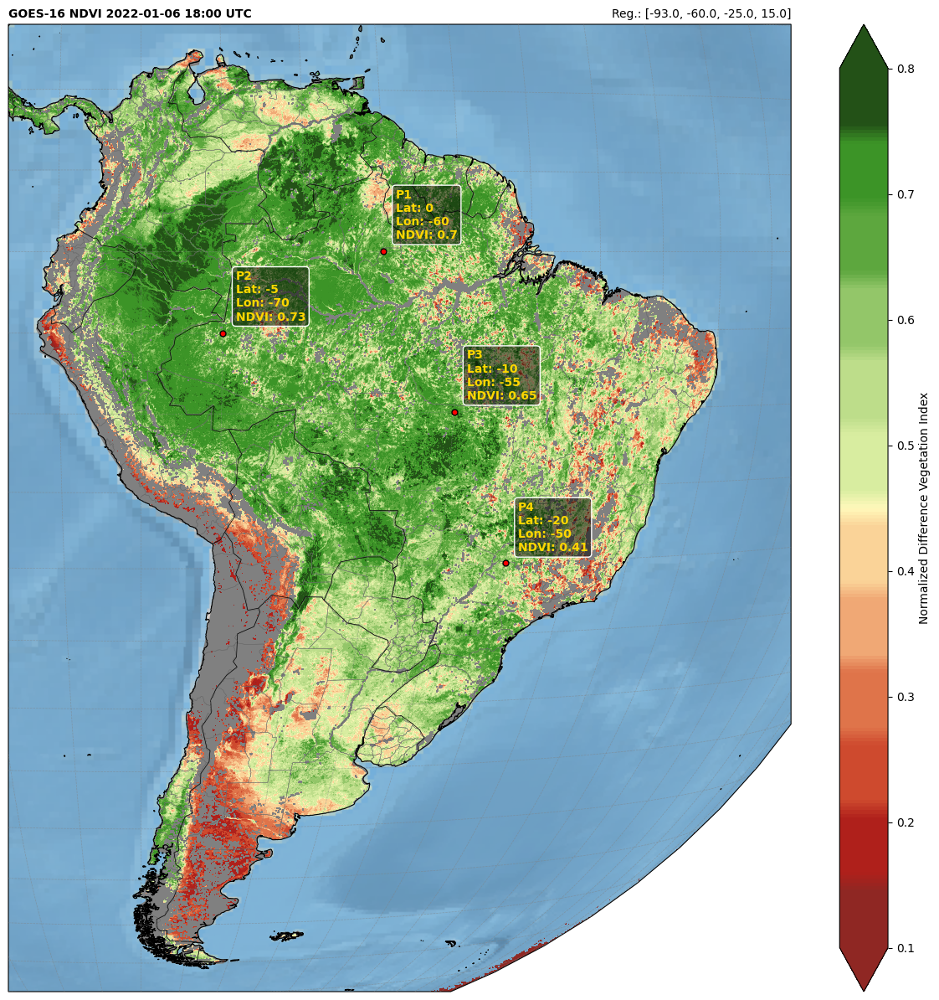

202201071800


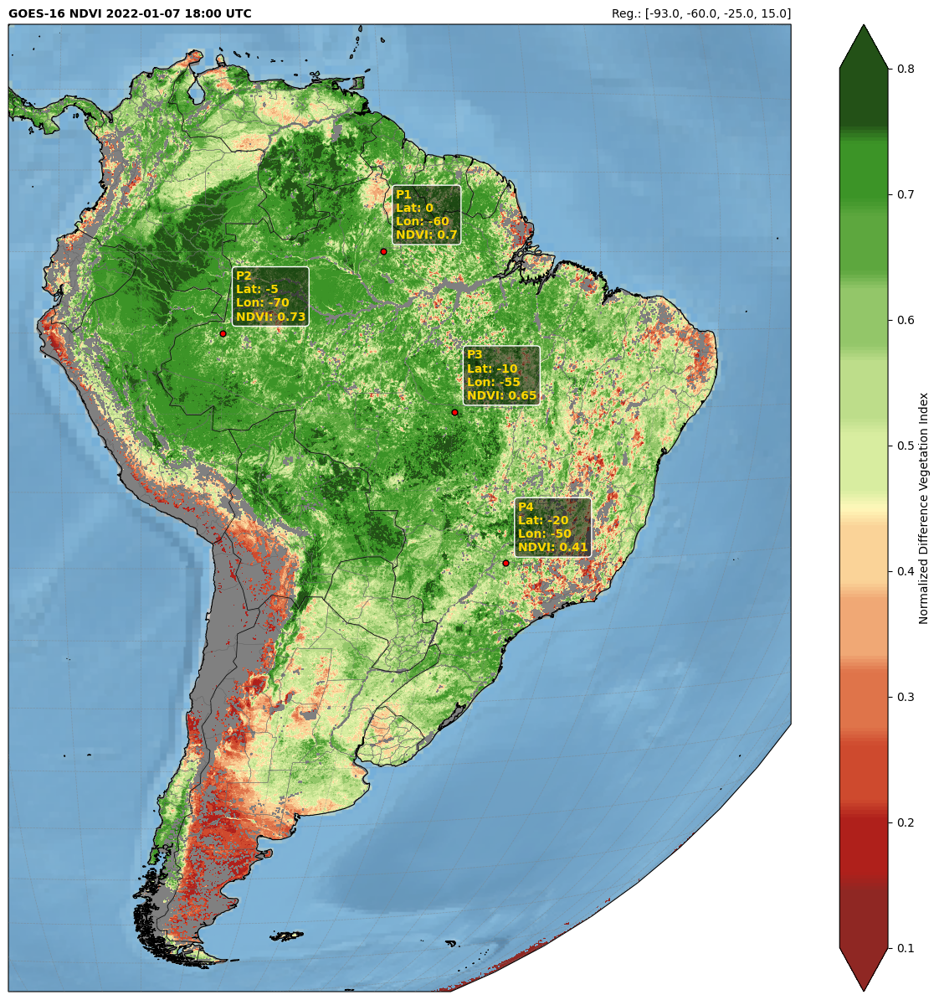

202201081800


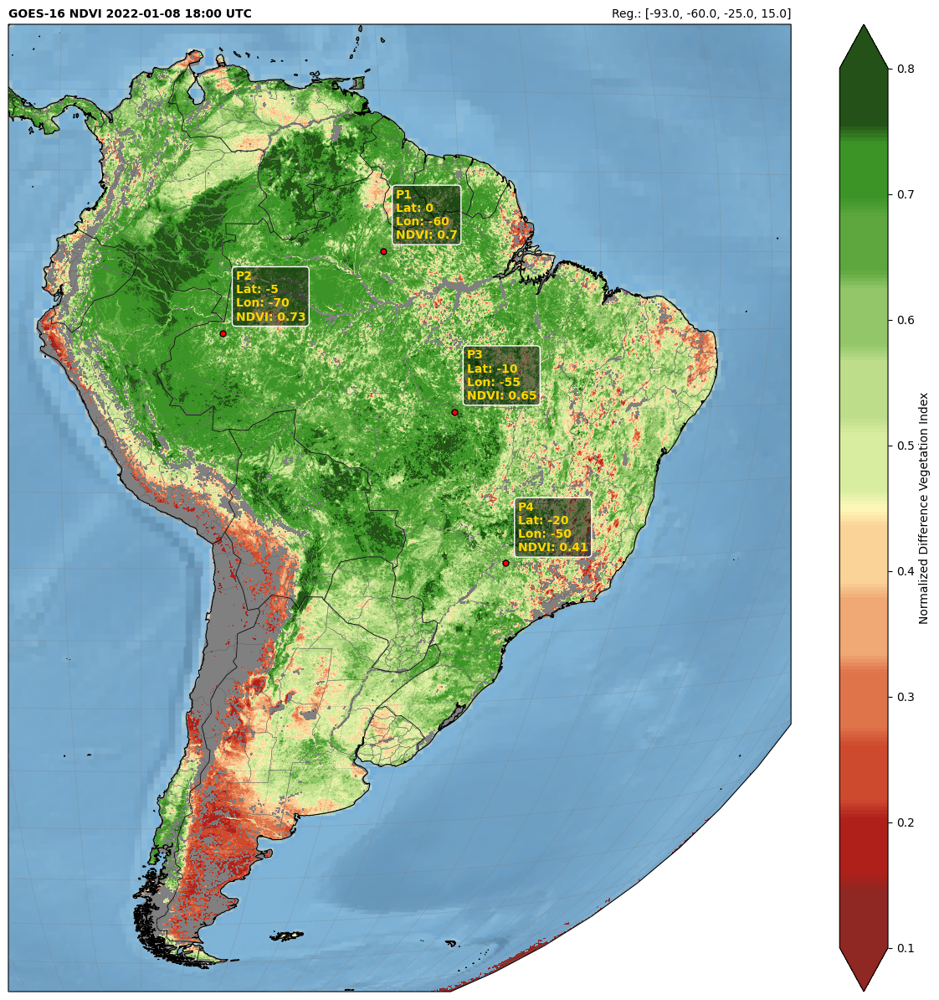

202201091800


EndpointConnectionError: Could not connect to the endpoint URL: "https://noaa-goes16.s3.amazonaws.com/?list-type=2&prefix=ABI-L2-CMIPF%2F2022%2F009%2F18%2FOR_ABI-L2-CMIPF-M6C02_G16_s20220091800&delimiter=%2F&encoding-type=url"

In [5]:
#-----------------------------------------------------------------------------------------------------------
# Agrometeorology Course - Demonstration: Normalized Difference Vegetation Index (NDVI) - Extract Values
# Author: Diego Souza
#-----------------------------------------------------------------------------------------------------------
# Required modules
from netCDF4 import Dataset                    # Read / Write NetCDF4 files
import matplotlib.pyplot as plt                # Plotting library
from datetime import datetime                  # Basic Dates and time types
from datetime import timedelta, date, datetime # Basic Dates and time types
import cartopy, cartopy.crs as ccrs            # Plot maps
import cartopy.io.shapereader as shpreader     # Import shapefiles
import cartopy.feature as cfeature             # Cartopy features
import numpy as np                             # Scientific computing with Python
import os                                      # Miscellaneous operating system interfaces
# from utilities import download_CMI             # Our own utilities
# from utilities import geo2grid, latlon2xy, convertExtent2GOESProjection      # Our own utilities
#-----------------------------------------------------------------------------------------------------------
# Input and output directories
input = "../data/goes16/Samples"; os.makedirs(input, exist_ok=True)
output = "../data/goes16/Animation"; os.makedirs(output, exist_ok=True)

# Desired extent
extent = [-93.0, -60.00, -25.00, 15.00] # Min lon, Min lat, Max lon, Max lat

# Initial date and time to process
date_ini = '202201011800'

# Number of days to accumulate
ndays = 15

# Convert to datetime
date_ini = datetime(int(date_ini[0:4]), int(date_ini[4:6]), int(date_ini[6:8]), int(date_ini[8:10]), int(date_ini[10:12]))
date_end = date_ini + timedelta(days=ndays)

# Create our references for the loop
date_loop = date_ini

#-----------------------------------------------------------------------------------------------------------
# NDVI colormap creation 
import matplotlib
colors = ["#8f2723", "#8f2723", "#8f2723", "#8f2723", "#af201b", "#af201b", "#af201b", "#af201b", "#ce4a2e", "#ce4a2e", "#ce4a2e", "#ce4a2e", 
          "#df744a", "#df744a", "#df744a", "#df744a", "#f0a875", "#f0a875", "#f0a875", "#f0a875", "#fad398", "#fad398", "#fad398", "#fad398",
          "#fff8ba",
          "#d8eda0", "#d8eda0", "#d8eda0", "#d8eda0", "#bddd8a", "#bddd8a", "#bddd8a", "#bddd8a", "#93c669", "#93c669", "#93c669", "#93c669", 
          "#5da73e", "#5da73e", "#5da73e", "#5da73e", "#3c9427", "#3c9427", "#3c9427", "#3c9427", "#235117", "#235117", "#235117", "#235117"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
cmap.set_over('#235117')
cmap.set_under('#8f2723')
vmin = 0.1
vmax = 0.8
#-----------------------------------------------------------------------------------------------------------

# Variable to check if is the first iteration
first = True

# Create our references for the loop
date_loop = date_ini

while (date_loop <= date_end):

    # Date structure
    yyyymmddhhmn = date_loop.strftime('%Y%m%d%H%M') 
    print(yyyymmddhhmn)

    # Download the file for Band 02
    file_name_ch02 = download_CMI(yyyymmddhhmn, '2', input)

    # Download the file for Band 03
    file_name_ch03 = download_CMI(yyyymmddhhmn, '3', input)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # If one the files hasn't been downloaded for some reason, skip the current iteration
    if not (os.path.exists(f'{input}/{file_name_ch02}.nc')) or not (os.path.exists(f'{input}/{file_name_ch03}.nc')):
      # Increment the date_loop
      date_loop = date_loop + timedelta(days=1)
      print("The file is not available, skipping this iteration.")
      continue

    # Open the GOES-R image (Band 02)
    file = Dataset(f'{input}/{file_name_ch02}.nc')
                      
    # Convert lat/lon to grid-coordinates
    lly, llx = geo2grid(extent[1], extent[0], file)
    ury, urx = geo2grid(extent[3], extent[2], file)
            
    # Get the pixel values
    data_ch02 = file.variables['CMI'][ury:lly, llx:urx][::2 ,::2]   
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Open the GOES-R image (Band 03)
    file = Dataset(f'{input}/{file_name_ch03}.nc')
                      
    # Convert lat/lon to grid-coordinates
    lly, llx = geo2grid(extent[1], extent[0], file)
    ury, urx = geo2grid(extent[3], extent[2], file)
            
    # Get the pixel values
    data_ch03 = file.variables['CMI'][ury:lly, llx:urx]      
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Make the arrays equal size
    cordX = np.shape(data_ch02)[0], np.shape(data_ch03)[0]
    cordY = np.shape(data_ch02)[1], np.shape(data_ch03)[1]

    minvalX = np.array(cordX).min()
    minvalY = np.array(cordY).min()

    data_ch02 = data_ch02[0:minvalX, 0:minvalY]
    data_ch03 = data_ch03[0:minvalX, 0:minvalY]
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Calculate the NDVI
    data = (data_ch03 - data_ch02) / (data_ch03 + data_ch02)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # Compute data-extent in GOES projection-coordinates
    img_extent = convertExtent2GOESProjection(extent)
    
    #-----------------------------------------------------------------------------------------------------------
    
    # If it's the first iteration, create the array that will store the max values
    if (first == True):
      first = False
      ndvi_max = np.full((data_ch02.shape[0],data_ch02.shape[1]),-9999)
    
    # Keep the maximuns, ignoring the nans
    ndvi_max = np.fmax(data,ndvi_max)
    # Remove low values from the accumulation
    ndvi_max[ndvi_max < 0.1] = np.nan
    
    # Choose the plot size (width x height, in inches)
    plt.figure(figsize=(15,15))

    # Use the Geostationary projection in cartopy
    ax = plt.axes(projection=ccrs.Geostationary(central_longitude=-75.0, satellite_height=35786023.0))
   
    # Add a land mask
    ax.stock_img()       
    land = ax.add_feature(cfeature.LAND, facecolor='gray', zorder=1)

    #-----------------------------------------------------------------------------------------------------------
    # Define the coordinates to extract the data (lat,lon) <- pairs
    coordinates = [('P1', 0,-60), ('P2', -5,-70), ('P3', -10,-55), ('P4', -20,-50)]

    for label, lat, lon in coordinates:
      # Reading the data from a coordinate
      lat_point = lat
      lon_point = lon
      
      # Convert lat/lon to grid-coordinates
      lat_ind, lon_ind = geo2grid(lat_point, lon_point, file)    
      NDVI_point = (ndvi_max[lat_ind - ury, lon_ind - llx]).round(2)  

      # Adding the data as an annotation
      # Add a circle
      ax.plot(lon_point, lat_point, 'o', color='red', markersize=5, transform=ccrs.Geodetic(), markeredgewidth=1.0, markeredgecolor=(0, 0, 0, 1), zorder=8)
      
      # Add a text
      txt_offset_x = 0.8
      txt_offset_y = 0.8
      
      plt.annotate(label + "\n" + "Lat: " + str(lat_point) + "\n" + "Lon: " + str(lon_point) + "\n" + "NDVI: " + str(NDVI_point) + '', 
                  xy=(lon_point + txt_offset_x, lat_point + txt_offset_y), xycoords=ccrs.PlateCarree()._as_mpl_transform(ax), 
                  fontsize=10, fontweight='bold', color='gold', bbox=dict(boxstyle="round",fc=(0.0, 0.0, 0.0, 0.5), ec=(1., 1., 1.)), alpha = 1.0, zorder=9) 
      
    #-----------------------------------------------------------------------------------------------------------

    # Plot the image
    img = ax.imshow(ndvi_max, origin='upper', vmin=vmin, vmax=vmax, extent=img_extent, cmap=cmap, zorder=2)
   
    # Add a shapefile
    shapefile = list(shpreader.Reader('ne_10m_admin_1_states_provinces.shp').geometries())
    ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='dimgray',facecolor='none', linewidth=0.3, zorder=4)

    # Add coastlines, borders and gridlines
    ax.coastlines(resolution='10m', color='black', linewidth=0.8, zorder=5)
    ax.add_feature(cartopy.feature.BORDERS, edgecolor='black', linewidth=0.5, zorder=6)
    ax.gridlines(color='gray', alpha=0.5, linestyle='--', linewidth=0.5, xlocs=np.arange(-180, 180, 5), ylocs=np.arange(-90, 90, 5), zorder=7)

    # Add a colorbar
    plt.colorbar(img, label='Normalized Difference Vegetation Index', extend='both', orientation='vertical', pad=0.05, fraction=0.05)

    # Extract date
    date = (datetime.strptime(file.time_coverage_start, '%Y-%m-%dT%H:%M:%S.%fZ'))

    # Add a title
    plt.title('GOES-16 NDVI ' + date.strftime('%Y-%m-%d %H:%M') + ' UTC', fontweight='bold', fontsize=10, loc='left')
    plt.title('Reg.: ' + str(extent) , fontsize=10, loc='right')
        
    # Save the image
    plt.savefig(f'{output}/G16_NDVI_{yyyymmddhhmn}.png', bbox_inches='tight', pad_inches=0, dpi=300)

    # Show the image
    plt.show()

    # Increment the date_loop
    date_loop = date_loop + timedelta(days=1)